# python处理excel相关的数据非常方便
## 假如你是一位APP数据运营，每天技术监控部门会给你两个平台投放的数据监控结果。格式统一。
## 平台一:
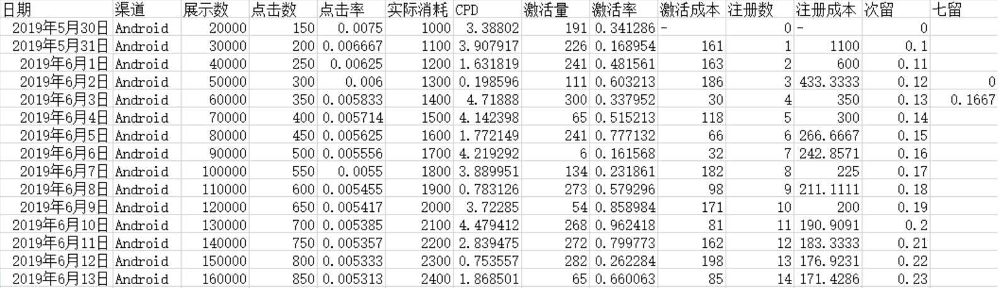

## 平台二：

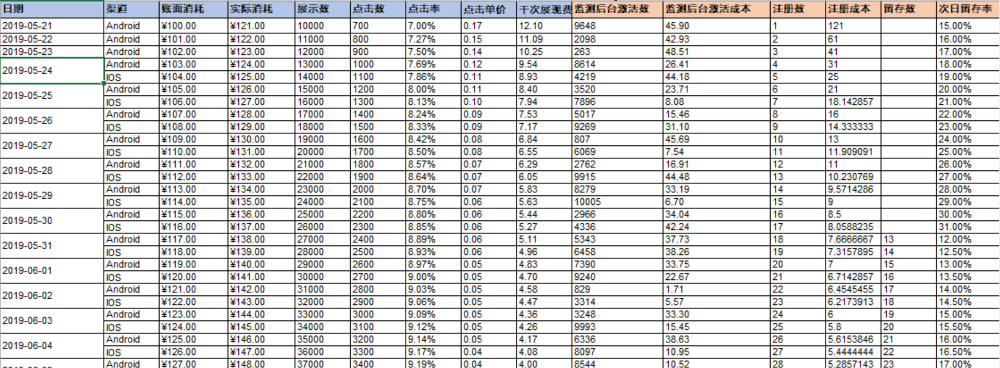

## 现在假如你的老板每天都会问你，我们这个APP整体的激活成本走势怎么样。

## 一个比较聪明的做法是直接写一个python脚本，把不同平台的数据整合到一起


In [14]:
import pandas as pd
platform1 = pd.read_excel("平台投放数据.xlsx",sheet_name = '平台一')[['日期','渠道','实际消耗','展示数','点击数','点击率']]
platform2 = pd.read_excel("平台投放数据.xlsx",sheet_name = '平台二')[['日期','渠道','实际消耗','展示数','点击数','点击率']]

platform1['平台'] = '平台一'
platform2['平台'] = '平台二'

platform = platform1.copy()
platform = pd.concat([platform1,platform2],axis = 0)


In [15]:
platform

,日期,渠道,实际消耗,展示数,点击数,点击率,平台
0,2019-05-21,Android,121,10000,700,0.070000,平台一
1,2019-05-22,Android,122,11000,800,0.072727,平台一
2,2019-05-23,Android,123,12000,900,0.075000,平台一
3,2019-05-24,Android,124,13000,1000,0.076923,平台一
4,NaT,IOS,125,14000,1100,0.078571,平台一
5,2019-05-25,Android,126,15000,1200,0.080000,平台一
6,NaT,IOS,127,16000,1300,0.081250,平台一
7,2019-05-26,Android,128,17000,1400,0.082353,平台一
8,NaT,IOS,129,18000,1500,0.083333,平台一
9,2019-05-27,Android,130,19000,1600,0.084211,平台一


## 假如老板问，2019年5月30日以后，所有平台实际消耗金额每天分别为多少。


In [16]:
actual_costs = platform[platform['日期']>=pd.Timestamp(2019,5,30)]
actual_costs_perday = actual_costs.groupby(by = ['日期'])['实际消耗'].sum()
actual_costs_perday

日期
2019-05-30    1136
2019-05-31    1238
2019-06-01    1340
2019-06-02    1442
2019-06-03    1544
2019-06-04    1646
2019-06-05    1748
2019-06-06    1850
2019-06-07    1952
2019-06-08    2054
2019-06-09    2156
2019-06-10    2258
2019-06-11    2360
2019-06-12    2462
2019-06-13    2564
Name: 实际消耗, dtype: int64

# python提取数据也是十分方便的

## 从事行业研究的朋友会经常遇到从各个渠道获取数据的任务。比如中美贸易战期间，美国USTR公布的关税清单。

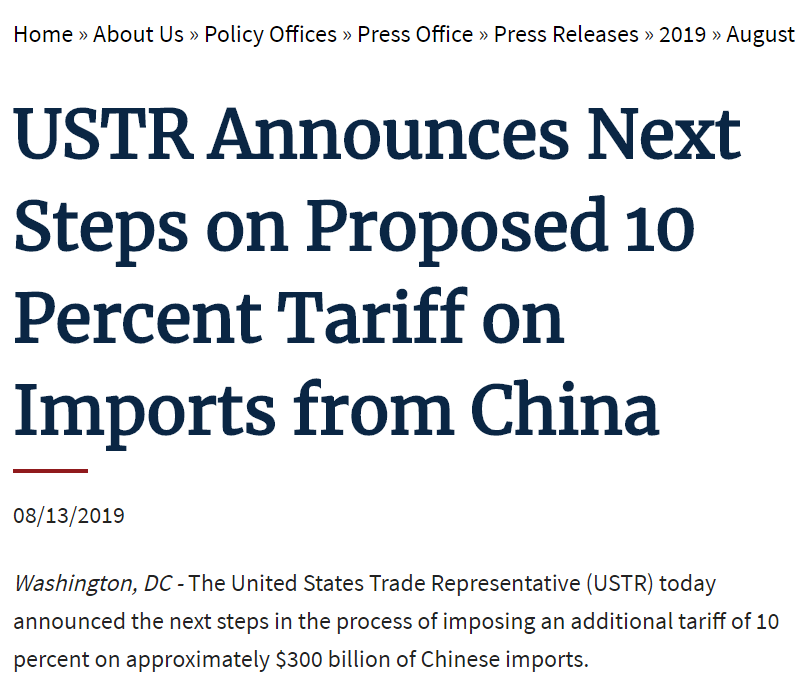

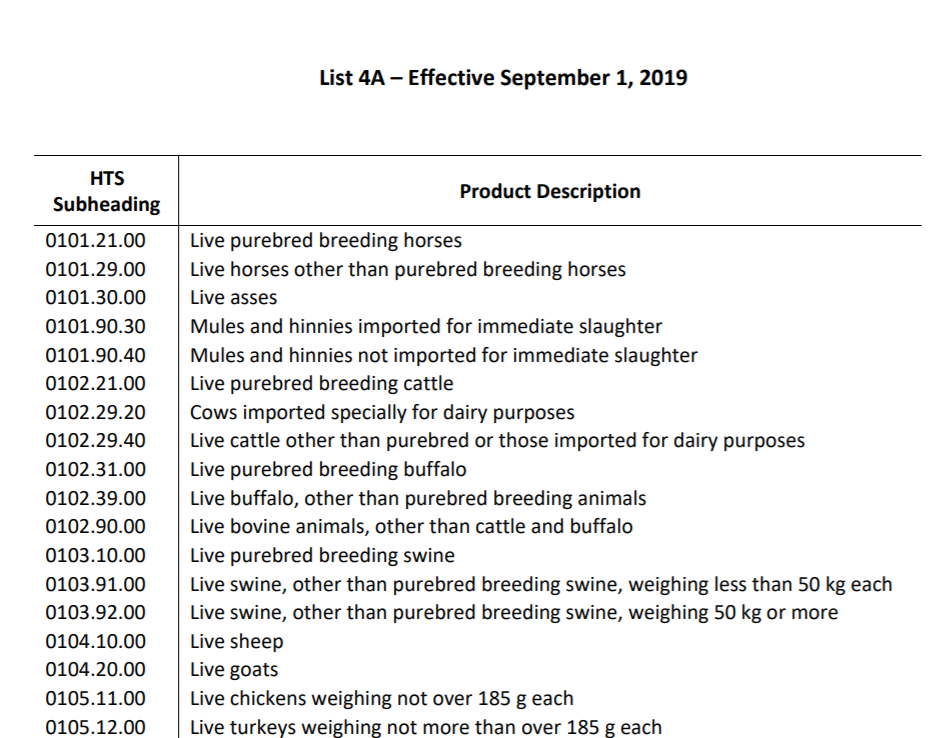

## 假如说我们要知道最新一期的中美贸易关税清单影响的行业有哪些。我们可以用一些非常便捷的pdf包帮我们提取数据，之后做解析。

In [9]:
import camelot as cl
tables = cl.read_pdf("9-1effective.pdf",flavor = 'stream',pages = 'all')

import pandas as pd
dfs = pd.DataFrame()
for table in tables:
    dfs = pd.concat([dfs,table.df.iloc[4:]])
dfs.columns = ['code','category']

data = []
for idx,row in dfs.iterrows():
    if row['code'] == '':
        continue
    if dfs.iloc[idx+1,:]['code'] == '':
        data.append([row['code'],row['category']+ ' '+dfs.iloc[idx+1,:]['category']])
    
    else:
        data.append([row['code'],row['category']])
data = pd.DataFrame(data,columns = ['code','category'])
data.head()

,code,category
0,0101.21.00,Live purebred breeding horses
1,0101.29.00,Live horses other than purebred breeding horses
2,0101.30.00,Live asses
3,0101.90.30,Mules and hinnies imported for immediate slaug...
4,0101.90.40,Mules and hinnies not imported for immediate s...


## 再结合HTS Subheading的代码，便可以很快地做出当前的关税征收状况的详细分析了